In [1]:
import black
import jupyter_black

jupyter_black.load()
import numpy as np
import openTSNE as TSNE
import matplotlib.pyplot as plt
from dataclasses import dataclass
import importlib
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import pandas as pd
import sklearn.datasets
from openTSNE.nearest_neighbors import NNDescent

from sklearn.neighbors import NearestNeighbors
import os
import utils.Utils as utils
from utils.Utils import GoodnessOfFit
import pickle
import re

In [2]:
np.random.seed(42)
ALPHAS = [0.3, 0.6, 0.8, 1, 2, 4, 8, 16, 32, 64, 100, 128]
print(len(ALPHAS))

test_alphas = [
    0.6,
    1,
]

12


In [2]:
@dataclass
class SwissHole:
    datapoints: np.ndarray
    labels: np.ndarray
    n_samples: int

    @classmethod
    def generate(cls, n_samples: int, noise: float = 0.1):
        data, labels = sklearn.datasets.make_swiss_roll(
            n_samples=n_samples, noise=noise, hole=True
        )
        return cls(data, labels, n_samples)

    def plot(self, width=800, height=800, title="Swiss Hole"):
        utils.plot_swiss_roll_plotly(
            self.datapoints,
            self.labels,
            n_samples=self.n_samples,
            width=width,
            height=height,
            title=title,
        )

In [3]:
@dataclass
class SwissRoll:
    datapoints: np.ndarray
    labels: np.ndarray
    n_samples: int

    @classmethod
    def generate(self, n_samples, noise):
        datapoints, labels = sklearn.datasets.make_swiss_roll(
            n_samples=n_samples, noise=noise
        )
        return SwissRoll(datapoints=datapoints, labels=labels, n_samples=n_samples)

    def plot(self, width=None, height=None, title=None):
        utils.plot_swiss_roll_plotly(
            self.datapoints,
            self.labels,
            n_samples=self.n_samples,
            width=width,
            height=height,
            title=title,
        )

In [4]:
def load_tsne_results(model: str, n_samples: int):
    # search file by name
    for dir, _, files in os.walk("."):
        pattern = rf"^{model} \({n_samples}( samples)?\)_tsne_results"
        for file in files:
            if re.match(pattern, file):
                return pickle.load(open(file, "rb"))
    print(f"Could not find file with pattern {pattern}")
    return None

In [6]:
importlib.reload(utils)
swiss_roll_500 = SwissRoll.generate(500, 0.0)
swiss_roll_500.plot(width=400, height=400, title="Swiss Roll with 500 samples")

In [7]:
importlib.reload(utils)
tsne_swiss_roll_500 = utils.compute_tsne_embedding(
    raw_data=swiss_roll_500.datapoints,
    alphas=ALPHAS,
    labels=swiss_roll_500.labels,
    dataset_name="Swiss Roll (500 samples)",
    compute_metrics=True,
    save_results=True,
)

Computing the shared affinities...
Computing the PCA initialization...
Computing t-SNE embedding for alpha=0.3...
Computing t-SNE embedding for alpha=0.6...
Computing t-SNE embedding for alpha=0.8...
Computing t-SNE embedding for alpha=1...
Computing t-SNE embedding for alpha=2...
Computing t-SNE embedding for alpha=4...
Computing t-SNE embedding for alpha=8...
Computing t-SNE embedding for alpha=16...
Computing t-SNE embedding for alpha=32...
Computing t-SNE embedding for alpha=64...
Computing t-SNE embedding for alpha=100...
Computing t-SNE embedding for alpha=128...
Saving results to a .pkl file...


In [39]:
importlib.reload(utils)
utils.plot_TSNE(
    tsne_results=tsne_swiss_roll_500,
    title="Swiss Roll (500 samples)",
    labeled=False,
    show=False,
    display_metrics=True,
    height=800,
    width=1600,
)

In [ ]:
from openTSNE import TSNE
from openTSNE import initialization
from openTSNE import affinity

# from openTSNE.initialization import PCA
import matplotlib.pyplot as plt

n_iter = 100
optimal_dof = 1

KLs = []
# step 1: compute affinities
P = affinity.PerplexityBasedNN(
    swiss_roll_500.datapoints,
    perplexity=30,
    metric="euclidean",
    n_jobs=1,
    random_state=0,
)

# step 2: initialize Y
Y = initialization.pca(swiss_roll_500.datapoints, random_state=0)

# step 3: initialize the embedding
tsne = TSNE(n_components=2, perplexity=30, random_state=0, dof=optimal_dof)
embedding = tsne.prepare_initial(
    X=swiss_roll_500.datapoints, affinities=P, initialization=Y
)

for N in range(n_iter):
    embedding.optimize(1, inplace=True)
    print(f"KL divergence at iteration {N}: {embedding.kl_divergence}")
    kl = embedding.kl_divergence
    KLs.append(kl)

result = embedding

KL divergence at iteration 0: 2.776986700079796
KL divergence at iteration 1: 2.7770578587029036
KL divergence at iteration 2: 2.7770965334110524
KL divergence at iteration 3: 2.776994579132589
KL divergence at iteration 4: 2.775750125823956
KL divergence at iteration 5: 2.759137188184148
KL divergence at iteration 6: 2.5722792556672687
KL divergence at iteration 7: 1.9304880815753958
KL divergence at iteration 8: 1.4142827968481146
KL divergence at iteration 9: 1.1074465312875024
KL divergence at iteration 10: 0.9222668848563629
KL divergence at iteration 11: 0.8040795568183565
KL divergence at iteration 12: 0.726397225488661
KL divergence at iteration 13: 0.6787429198904622
KL divergence at iteration 14: 0.6466913050252927
KL divergence at iteration 15: 0.6218214065364336
KL divergence at iteration 16: 0.6020562010206874
KL divergence at iteration 17: 0.5869869796332683
KL divergence at iteration 18: 0.5753228425203503
KL divergence at iteration 19: 0.5652994848891932
KL divergence a

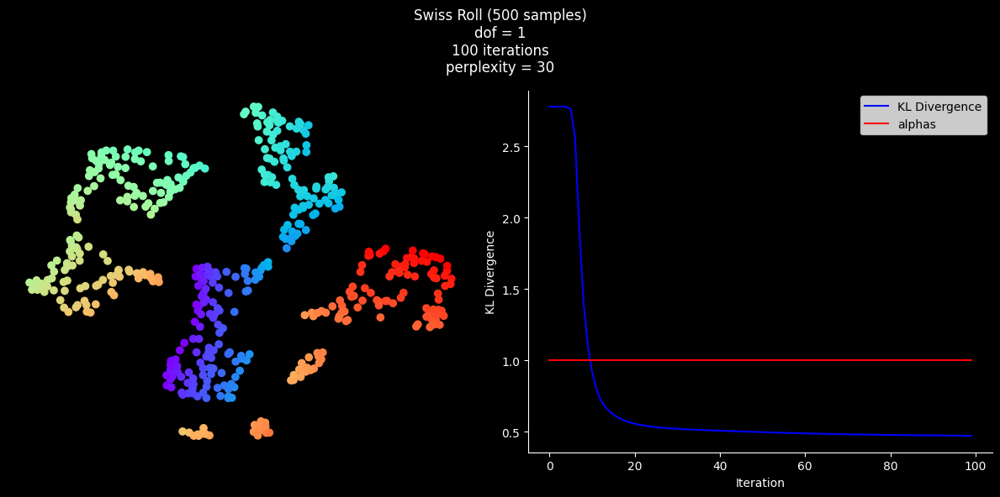

In [ ]:
x = np.array(result[:, 0])
y = np.array(result[:, 1])

alphas = 100 * [1]

fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].scatter(x, y, c=swiss_roll_500.labels, cmap="rainbow", alpha=1)
ax[1].plot(KLs, color="blue", label="KL Divergence")
# arg for line title:

ax[1].plot(alphas, color="red", label="alphas")
ax[1].legend()
# set black background everywhere
fig.patch.set_facecolor("black")
# ax.gca().set_facecolor("black")

# set black background for the plot
ax[0].set_facecolor("black")
ax[1].set_facecolor("black")

plt.suptitle(
    f"Swiss Roll (500 samples)\ndof = {optimal_dof}\n{n_iter} iterations\nperplexity = 30",
    color="white",
)
ax[0].set_xticks([])
ax[0].set_yticks([])

# set white color for the labels
ax[1].xaxis.label.set_color("white")
ax[1].yaxis.label.set_color("white")

# set white color for the ticks
ax[1].tick_params(axis="x", colors="white")
ax[1].tick_params(axis="y", colors="white")

# set white color for the axis
ax[1].spines["bottom"].set_color("white")
ax[1].spines["left"].set_color("white")

ax[1].set_xlabel("Iteration", color="white")
ax[1].set_ylabel("KL Divergence", color="white")


# sns.despine(left=True, bottom=True)
plt.tight_layout()

# set colormap

In [40]:
swiss_roll_1000 = SwissRoll.generate(1000, 0.0)
swiss_roll_1000.plot(width=400, height=400, title="Swiss Roll with 1000 samples")

In [9]:
tsne_swiss_roll_1000 = utils.compute_tsne_embedding(
    raw_data=swiss_roll_1000.datapoints,
    alphas=ALPHAS,
    labels=swiss_roll_1000.labels,
    dataset_name="Swiss Roll (1000 samples)",
    compute_metrics=True,
    save_results=True,
)

NameError: name 'swiss_roll_1000' is not defined

In [5]:
tsne_swiss_roll_1000 = load_tsne_results("Swiss Roll", 1000)

In [6]:
utils.plot_TSNE(
    tsne_results=tsne_swiss_roll_1000,
    title="Swiss Roll (1000 samples)",
    labeled=False,
    show=False,
    display_metrics=True,
    width=1000,
    height=600,
)

In [44]:
swiss_roll_5000 = SwissRoll.generate(5000, 0.0)
swiss_roll_5000.plot(width=400, height=400, title="Swiss Roll with 5000 samples")

In [45]:
tsne_swiss_roll_5000 = utils.compute_tsne_embedding(
    raw_data=swiss_roll_5000.datapoints,
    alphas=ALPHAS,
    labels=swiss_roll_5000.labels,
    dataset_name="Swiss Roll (5000 samples)",
    compute_metrics=True,
    save_results=True,
)

Computing the shared affinities...
Computing the PCA initialization...
Computing t-SNE embedding for alpha=0.3...
Computing t-SNE embedding for alpha=0.6...
Computing t-SNE embedding for alpha=0.8...
Computing t-SNE embedding for alpha=1...
Computing t-SNE embedding for alpha=2...
Computing t-SNE embedding for alpha=4...
Computing t-SNE embedding for alpha=8...
Computing t-SNE embedding for alpha=16...
Computing t-SNE embedding for alpha=32...
Computing t-SNE embedding for alpha=64...
Computing t-SNE embedding for alpha=100...
Computing t-SNE embedding for alpha=128...
Saving results to a .pkl file...


In [73]:
importlib.reload(utils)

<module 'utils.Utils' from '/Users/a1/Documents/t-SNE-project/utils/Utils.py'>

In [47]:
utils.plot_TSNE(
    tsne_results=tsne_swiss_roll_5000,
    title="Swiss Roll (500 samples)",
    display_metrics=True,
    labeled=False,
    show=False,
    width=1000,
    height=600,
)

In [ ]:
from utils.Utils import DataSetTSNE

swiss_roll_500_dataset = DataSetTSNE("Swiss Roll (500)", tsne_swiss_roll_500, ALPHAS)
swiss_roll_1000_dataset = DataSetTSNE("Swiss Roll (1000)", tsne_swiss_roll_1000, ALPHAS)
swiss_roll_5000_dataset = DataSetTSNE("Swiss Roll (5000)", tsne_swiss_roll_5000, ALPHAS)

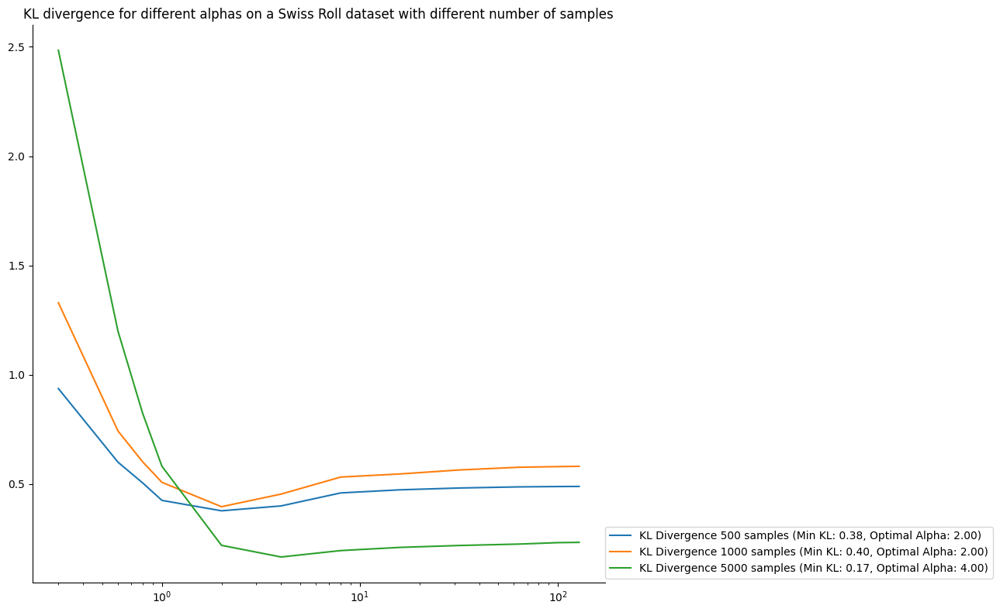

In [71]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(
    swiss_roll_500_dataset.alphas,
    swiss_roll_500_dataset.KLs,
    label=f"KL Divergence 500 samples (Min KL: {swiss_roll_500_dataset.min_KL:.2f}, Optimal Alpha: {swiss_roll_500_dataset.optimal_alpha_KL:.2f})",
)
ax.plot(
    swiss_roll_1000_dataset.alphas,
    swiss_roll_1000_dataset.KLs,
    label=f"KL Divergence 1000 samples (Min KL: {swiss_roll_1000_dataset.min_KL:.2f}, Optimal Alpha: {swiss_roll_1000_dataset.optimal_alpha_KL:.2f})",
)
ax.plot(
    swiss_roll_5000_dataset.alphas,
    swiss_roll_5000_dataset.KLs,
    label=f"KL Divergence 5000 samples (Min KL: {swiss_roll_5000_dataset.min_KL:.2f}, Optimal Alpha: {swiss_roll_5000_dataset.optimal_alpha_KL:.2f})",
)
ax.set_xscale("log")
ax.set_title(
    "KL divergence for different alphas on a Swiss Roll dataset with different number of samples"
)
sns.despine()

plt.tight_layout()
ax.legend(bbox_to_anchor=(1, 0.1), loc="upper left", borderaxespad=0.0)
plt.show()

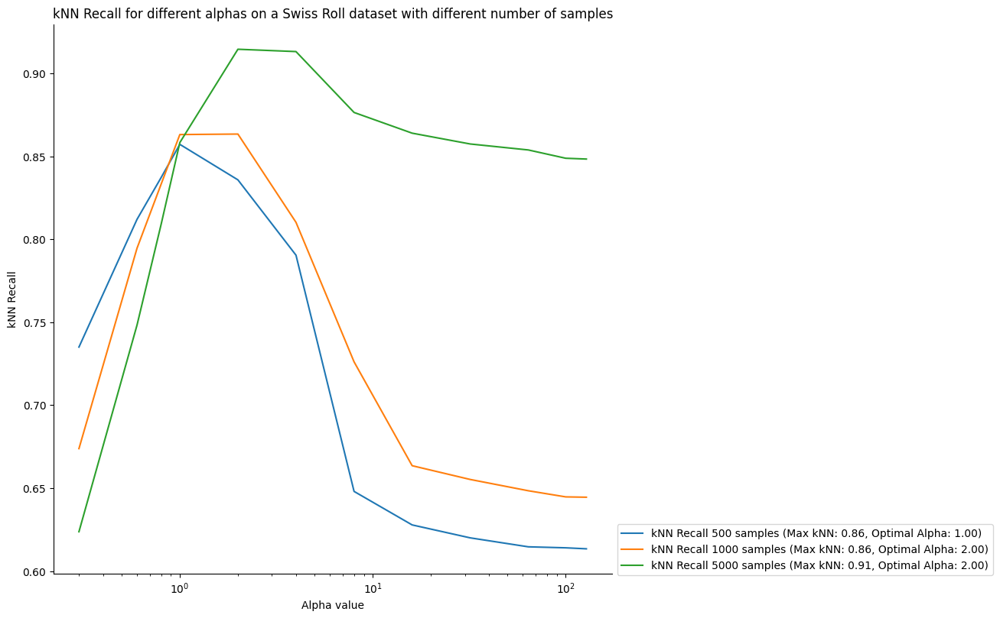

In [72]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(
    swiss_roll_500_dataset.alphas,
    swiss_roll_500_dataset.kNNs,
    label=f"kNN Recall 500 samples (Max kNN: {swiss_roll_500_dataset.max_kNN_recall:.2f}, Optimal Alpha: {swiss_roll_500_dataset.optimal_alpha_kNN:.2f})",
)

ax.plot(
    swiss_roll_1000_dataset.alphas,
    swiss_roll_1000_dataset.kNNs,
    label=f"kNN Recall 1000 samples (Max kNN: {swiss_roll_1000_dataset.max_kNN_recall:.2f}, Optimal Alpha: {swiss_roll_1000_dataset.optimal_alpha_kNN:.2f})",
)
ax.plot(
    swiss_roll_5000_dataset.alphas,
    swiss_roll_5000_dataset.kNNs,
    label=f"kNN Recall 5000 samples (Max kNN: {swiss_roll_5000_dataset.max_kNN_recall:.2f}, Optimal Alpha: {swiss_roll_5000_dataset.optimal_alpha_kNN:.2f})",
)

sns.despine()
ax.set_xscale("log")
ax.set_title(
    "kNN Recall for different alphas on a Swiss Roll dataset with different number of samples"
)
plt.tight_layout()
ax.legend(bbox_to_anchor=(1, 0.1), loc="upper left")
ax.set_ylabel("kNN Recall")
ax.set_xlabel("Alpha value")
plt.show()

In [78]:
swiss_hole_500 = SwissHole.generate(500, noise=0)
swiss_hole_500.plot(width=400, height=400, title="Swiss Hole with 500 samples")

In [79]:
tsne_swiss_hole_500 = utils.compute_tsne_embedding(
    raw_data=swiss_hole_500.datapoints,
    alphas=ALPHAS,
    labels=swiss_hole_500.labels,
    dataset_name="Swiss Hole (500 samples)",
    compute_metrics=True,
    save_results=True,
)

Computing the shared affinities...
Computing the PCA initialization...
Computing t-SNE embedding for alpha=0.3...
Computing t-SNE embedding for alpha=0.6...
Computing t-SNE embedding for alpha=0.8...
Computing t-SNE embedding for alpha=1...
Computing t-SNE embedding for alpha=2...
Computing t-SNE embedding for alpha=4...
Computing t-SNE embedding for alpha=8...
Computing t-SNE embedding for alpha=16...
Computing t-SNE embedding for alpha=32...
Computing t-SNE embedding for alpha=64...
Computing t-SNE embedding for alpha=100...
Computing t-SNE embedding for alpha=128...
Saving results to a .pkl file...


In [80]:
utils.plot_TSNE(
    tsne_results=tsne_swiss_hole_500,
    title="Swiss Hole (500 samples)",
    labeled=False,
    show=False,
    display_metrics=True,
    width=1000,
    height=600,
)

In [81]:
swiss_hole_1000 = SwissHole.generate(1000, noise=0)

In [82]:
tsne_swiss_hole_1000 = utils.compute_tsne_embedding(
    raw_data=swiss_hole_1000.datapoints,
    alphas=ALPHAS,
    labels=swiss_hole_1000.labels,
    dataset_name="Swiss Hole (1000 samples)",
    compute_metrics=True,
    save_results=True,
)

Computing the shared affinities...
Computing the PCA initialization...
Computing t-SNE embedding for alpha=0.3...
Computing t-SNE embedding for alpha=0.6...
Computing t-SNE embedding for alpha=0.8...
Computing t-SNE embedding for alpha=1...
Computing t-SNE embedding for alpha=2...
Computing t-SNE embedding for alpha=4...
Computing t-SNE embedding for alpha=8...
Computing t-SNE embedding for alpha=16...
Computing t-SNE embedding for alpha=32...
Computing t-SNE embedding for alpha=64...
Computing t-SNE embedding for alpha=100...
Computing t-SNE embedding for alpha=128...
Saving results to a .pkl file...


In [83]:
utils.plot_TSNE(
    tsne_results=tsne_swiss_hole_1000,
    title="Swiss Hole (1000 samples)",
    labeled=False,
    show=False,
    display_metrics=True,
    width=1000,
    height=600,
)

In [84]:
swiss_hole_5000 = SwissHole.generate(5000, noise=0)
tsne_swiss_hole_5000 = utils.compute_tsne_embedding(
    raw_data=swiss_hole_5000.datapoints,
    alphas=ALPHAS,
    labels=swiss_hole_5000.labels,
    dataset_name="Swiss Hole (5000 samples)",
    compute_metrics=True,
    save_results=True,
)
utils.plot_TSNE(
    tsne_results=tsne_swiss_hole_5000,
    title="Swiss Hole (5000 samples)",
    labeled=False,
    show=False,
    display_metrics=True,
    width=1000,
    height=600,
)

Computing the shared affinities...
Computing the PCA initialization...
Computing t-SNE embedding for alpha=0.3...
Computing t-SNE embedding for alpha=0.6...
Computing t-SNE embedding for alpha=0.8...
Computing t-SNE embedding for alpha=1...
Computing t-SNE embedding for alpha=2...
Computing t-SNE embedding for alpha=4...
Computing t-SNE embedding for alpha=8...
Computing t-SNE embedding for alpha=16...
Computing t-SNE embedding for alpha=32...
Computing t-SNE embedding for alpha=64...
Computing t-SNE embedding for alpha=100...
Computing t-SNE embedding for alpha=128...
Saving results to a .pkl file...


In [85]:
swiss_hole_500_dataset = DataSetTSNE("Swiss Hole (500)", tsne_swiss_hole_500, ALPHAS)
swiss_hole_1000_dataset = DataSetTSNE("Swiss Hole (1000)", tsne_swiss_hole_1000, ALPHAS)
swiss_hole_5000_dataset = DataSetTSNE("Swiss Hole (5000)", tsne_swiss_hole_5000, ALPHAS)

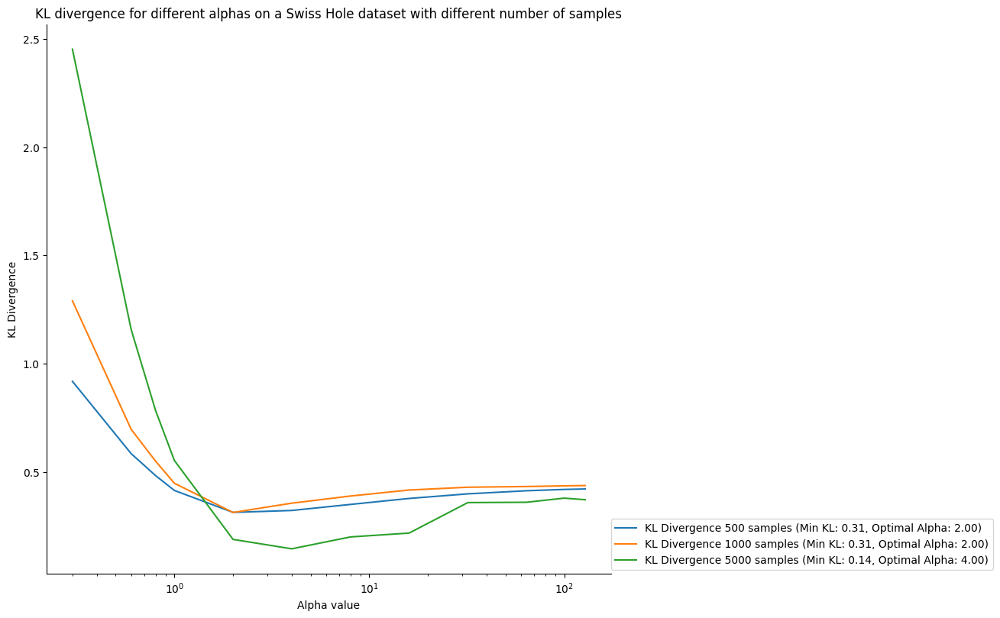

In [86]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(
    swiss_hole_500_dataset.alphas,
    swiss_hole_500_dataset.KLs,
    label=f"KL Divergence 500 samples (Min KL: {swiss_hole_500_dataset.min_KL:.2f}, Optimal Alpha: {swiss_hole_500_dataset.optimal_alpha_KL:.2f})",
)
ax.plot(
    swiss_hole_1000_dataset.alphas,
    swiss_hole_1000_dataset.KLs,
    label=f"KL Divergence 1000 samples (Min KL: {swiss_hole_1000_dataset.min_KL:.2f}, Optimal Alpha: {swiss_hole_1000_dataset.optimal_alpha_KL:.2f})",
)
ax.plot(
    swiss_hole_5000_dataset.alphas,
    swiss_hole_5000_dataset.KLs,
    label=f"KL Divergence 5000 samples (Min KL: {swiss_hole_5000_dataset.min_KL:.2f}, Optimal Alpha: {swiss_hole_5000_dataset.optimal_alpha_KL:.2f})",
)
ax.set_xscale("log")
ax.set_title(
    "KL divergence for different alphas on a Swiss Hole dataset with different number of samples"
)
sns.despine()
plt.tight_layout()
ax.legend(bbox_to_anchor=(1, 0.1), loc="upper left", borderaxespad=0.0)
ax.set_ylabel("KL Divergence")
ax.set_xlabel("Alpha value")
plt.show()

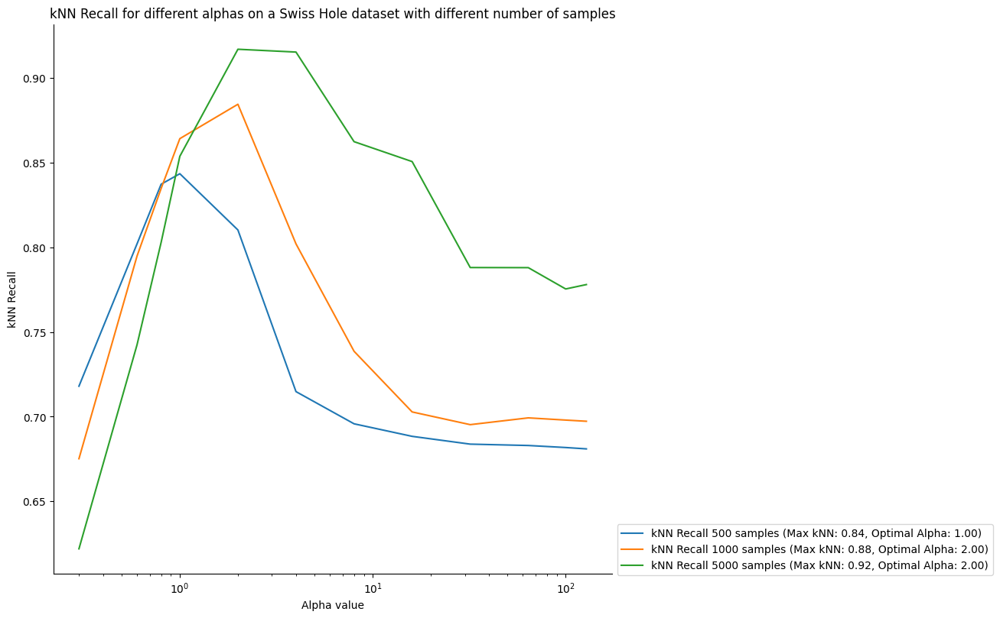

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(
    swiss_hole_500_dataset.alphas,
    swiss_hole_500_dataset.kNNs,
    label=f"kNN Recall 500 samples (Max kNN: {swiss_hole_500_dataset.max_kNN_recall:.2f}, Optimal Alpha: {swiss_hole_500_dataset.optimal_alpha_kNN:.2f})",
)
ax.plot(
    swiss_hole_1000_dataset.alphas,
    swiss_hole_1000_dataset.kNNs,
    label=f"kNN Recall 1000 samples (Max kNN: {swiss_hole_1000_dataset.max_kNN_recall:.2f}, Optimal Alpha: {swiss_hole_1000_dataset.optimal_alpha_kNN:.2f})",
)
ax.plot(
    swiss_hole_5000_dataset.alphas,
    swiss_hole_5000_dataset.kNNs,
    label=f"kNN Recall 5000 samples (Max kNN: {swiss_hole_5000_dataset.max_kNN_recall:.2f}, Optimal Alpha: {swiss_hole_5000_dataset.optimal_alpha_kNN:.2f})",
)
sns.despine()
ax.set_xscale("log")
ax.set_title(
    "kNN Recall for different alphas on a Swiss Hole dataset with different number of samples"
)
plt.tight_layout()
ax.legend(bbox_to_anchor=(1, 0.1), loc="upper left")
ax.set_ylabel("kNN Recall")
ax.set_xlabel("Alpha value")
plt.show()